# Import libraries


In [ ]:
import os
import pandas as pd
import numpy as np
import torch
import cv2
import collections
!pip install segmentation_models_pytorch
import segmentation_models_pytorch as smp
! pip install -U git+https://github.com/albu/albumentations --no-cache-dir
# ! pip install --upgrade albumentations
import albumentations as A

import json
from tqdm import tqdm

from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from glob import glob
from os import path
from PIL import Image
from tqdm import tqdm
from matplotlib import pyplot as plt
import torch

%matplotlib inline

from google.colab import drive
drive.mount("/content/drive/",force_remount=True)
import pathlib

import random
random.seed(11)

# Set up the pathes

In [26]:
ROOT_PATH_TRAIN = 'drive/My Drive/Course3/segmentation/train'
ROOT_PATH_TEST = 'drive/My Drive/Course3/segmentation/test'
DF_PATH_TRAIN = 'drive/My Drive/Course3/segmentation/train.csv'
PATH_TO_MODEL_WEIGHTS = 'drive/My Drive/Course3/segmentation/models/best_model.pth'

IMAGE_PREDICTION_SIZE = (256, 256)
# N_CLASSES = 46
N_CLASSES = 2

# Data Investigation

In [9]:
df_train = pd.read_csv(DF_PATH_TRAIN)
df_train.head()

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds
0,00000663ed1ff0c4e0132b9b9ac53f6e,6068157 7 6073371 20 6078584 34 6083797 48 608...,5214,3676,6,"115,136,143,154,230,295,316,317"
1,00000663ed1ff0c4e0132b9b9ac53f6e,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317"
2,00000663ed1ff0c4e0132b9b9ac53f6e,8521389 10 8526585 30 8531789 42 8537002 46 85...,5214,3676,28,163
3,00000663ed1ff0c4e0132b9b9ac53f6e,12903854 2 12909064 7 12914275 10 12919485 15 ...,5214,3676,31,"160,204"
4,00000663ed1ff0c4e0132b9b9ac53f6e,10837337 5 10842542 14 10847746 24 10852951 33...,5214,3676,32,219


In [10]:
df_0 = df_train[df_train['ClassId'].isin([0, 1])]

In [72]:
df_0.head(20)

,ImageId,EncodedPixels,Height,Width,ClassId,AttributesIds,CategoryId
1,00000663ed1ff0c4e0132b9b9ac53f6e,6323163 11 6328356 32 6333549 53 6338742 75 63...,5214,3676,0,"115,136,142,146,225,295,316,317",0
10,0000fe7c9191fba733c8a69cfaf962b7,1343707 9 1346138 27 1348569 44 1351000 62 135...,2448,2448,1,"0,115,145,146,295,316,317",1
24,00048c3a2fb9c29340473c4cfc06424a,257702 10 258670 26 259640 36 260572 6 260610 ...,975,650,1,"11,115,135,145,146,295,316,317",1
31,0006ea84499fd9a06fefbdf47a5eb4c0,73327 6 74328 18 75330 37 76335 63 77340 88 78...,1000,667,1,"11,135,146,295",1
37,000775b6b5e27b011dc8bba2d7b85211,309670 11 311259 33 312848 55 314440 72 316033...,1600,1067,1,"115,136,145,295,314,317",1
54,000b3ec2c6eaffb491a5abb72c2e3e26,458445 17 460731 51 463017 85 465303 115 46759...,2310,1536,1,"0,115,136,145,147,295,314,317",1
67,000cd2e13d1bdd28f480304d7bb9e1ca,1522034 13 1525024 39 1528014 64 1531004 90 15...,3000,2000,1,"135,146,295,316,317",1
119,0010ef2da53cd76ee26122a65f6e76ee,5153671 6 5158276 20 5162882 31 5167488 42 517...,4608,3072,0,"115,135,142,146,225,295,316,317",0
123,001657dc6f979869ebf38ea741e90675,82835 1 84831 4 86827 6 88823 9 90819 11 92815...,1998,1141,1,"0,115,136,145,146,295,301,320",1
143,0017af9f7fa8ce9e7558bb924cec324e,149 2 1941 8 3734 13 5526 19 7320 23 9114 26 1...,1797,607,1,"0,115,135,141,146,295,301,320,340",1


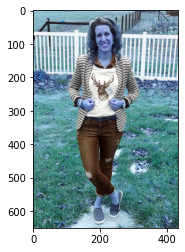

In [74]:
plt.imshow(cv2.imread(ROOT_PATH_TRAIN + '/0036f906cb15e240f113184b5eed8c69.jpg'))

`EncodedPixels` are **annotations**. We would like to reshape them into masks.

In [12]:
# we have an encoding of `EncodedPixesels` in the way:
# position where to start,
# lenght of how much to walk
def rle_decode(encoded_pixels, shape):
  height, width = shape[1], shape[0]
  sep_pixels = encoded_pixels.split()
  st_positions, lengths = [np.asarray(x, dtype=int) for x in (sep_pixels[0::2], sep_pixels[1::2])]
  # create empty - background mask
  empty_mask = np.zeros(shape[0] * shape[1], dtype=np.uint8)
  # make edges
  st_positions -=1
  ends = st_positions + lengths
  for st, end in zip(st_positions, ends):
    empty_mask[st:end] = 1
  # mask to 2d
  return empty_mask.reshape((height, width)).T


In [13]:
def create_one_represent_class(df_param):
    v_c_df = df_param['CategoryId'].value_counts().reset_index()
    one_represent = v_c_df.loc[v_c_df['CategoryId'] == 1, 'index'].tolist()
    df_param.loc[df_param['CategoryId'].isin(one_represent), 'CategoryId'] = 'one_represent'
    return df_param

def custom_train_test_split(df_param):
    
    df_param['CategoryId'] = df_param.ClassId.apply(lambda x: str(x).split("_")[0])
    
    img_categ = df_param.groupby('ImageId')['CategoryId'].apply(list).reset_index()
    img_categ['CategoryId'] = img_categ['CategoryId'].apply(lambda x: ' '.join(sorted(x)))
    
    img_categ = create_one_represent_class(img_categ)
    
    img_train, img_val  = train_test_split(img_categ, test_size=0.2, random_state=42, stratify=img_categ['CategoryId'])
    
    df_param = df_param.drop(columns='CategoryId')
    
    df_train = df_param[df_param['ImageId'].isin(img_train['ImageId'])].reset_index(drop=True)
    df_val = df_param[df_param['ImageId'].isin(img_val['ImageId'])].reset_index(drop=True)
    
    return df_train, df_val


In [14]:
# df_train, df_val = custom_train_test_split(df_train)
df_train, df_val = custom_train_test_split(df_0)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [81]:
class UnetDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, df, height, width, augmentation=None, preprocessing=None):
        
        self.preprocessing = preprocessing
        
        self.image_dir = image_dir
        self.df = df
        
        self.height = height
        self.width = width
        
        self.image_info = collections.defaultdict(dict)
        
        self.df['CategoryId'] = self.df.ClassId.apply(lambda x: str(x).split("_")[0])
        self.num_classes = self.df['CategoryId'].nunique()

        self.augmentation = augmentation
        self.preprocessing = preprocessing
        
        temp_df = self.df.groupby('ImageId')['EncodedPixels', 'CategoryId'].agg(lambda x: list(x)).reset_index()
        size_df = self.df.groupby('ImageId')['Height', 'Width'].mean().reset_index()
        temp_df = temp_df.merge(size_df, on='ImageId', how='left')
        
        for index, row in tqdm(temp_df.iterrows(), total=len(temp_df)):
            image_id = row['ImageId']
            image_path = os.path.join(self.image_dir, image_id)
            self.image_info[index]["image_id"] = image_id
            self.image_info[index]["image_path"] = image_path
            self.image_info[index]["width"] = self.width
            self.image_info[index]["height"] = self.height
            self.image_info[index]["labels"] = row["CategoryId"]
            self.image_info[index]["orig_height"] = row["Height"]
            self.image_info[index]["orig_width"] = row["Width"]
            self.image_info[index]["annotations"] = row["EncodedPixels"]

    def __getitem__(self, idx):
        flag = True
        while (flag):
          img_path = self.image_info[idx]["image_path"] + '.jpg'
          
          img = cv2.imread(img_path)
          if img is None:
            flag = True
            continue
          else:
            flag = False
          img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
          img = cv2.resize(img, (self.width, self.height))

          info = self.image_info[idx]
          
          mask = np.zeros((self.width, self.height, self.num_classes))
          
          for annotation, label in zip(info['annotations'], info['labels']):
              cur_mask = rle_decode(annotation, (info['orig_height'], info['orig_width']))
              mask[:, :, int(label)] += cv2.resize(cur_mask, (self.width, self.height))
              
          mask = (mask > 0.5).astype(np.float32)
          
          # apply augmentations
          if self.augmentation is not None:
              sample = self.augmentation(image=img, mask=mask)
              img, mask = sample['image'], sample['mask']
          
          # apply preprocessing
          if self.preprocessing is not None:
              sample = self.preprocessing(image=img, mask=mask)
              img, mask = sample['image'], sample['mask']
            
        return img, mask

    def __len__(self):
        return len(self.image_info)

In [82]:
def get_training_augmentation():
    # img_height, img_width = 128, 128
#     original_height, original_width = image.shape[:2]
    return A.Compose([
#                 A.PadIfNeeded(min_height=original_height, min_width=original_width, p=1),
                A.HorizontalFlip(p=0.5),
                A.VerticalFlip(p=0.5),              
                A.RandomRotate90(p=0.4),
                A.CLAHE(p=0.2),
                A.RandomBrightnessContrast(p=0.2),    
                A.RandomGamma(p=0.2),
                # A.augmentations.transforms.Resize(img_height, img_width, p=1),
            ])

In [83]:
def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args:
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        A.Lambda(image=preprocessing_fn),
        A.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return A.Compose(_transform)

In [84]:
ENCODER = 'mobilenet_v2'
ENCODER_WEIGHTS = 'imagenet'
DEVICE = 'cuda'

ACTIVATION = 'sigmoid'


In [85]:
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=N_CLASSES, 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [89]:
train_dataset = UnetDataset(
    ROOT_PATH_TRAIN,
    df_train[:100],
    IMAGE_PREDICTION_SIZE[0],
    IMAGE_PREDICTION_SIZE[1], 
    preprocessing=get_preprocessing(preprocessing_fn),
    augmentation=get_training_augmentation()
)

valid_dataset = UnetDataset(
    ROOT_PATH_TRAIN,
    df_val[:30],
    IMAGE_PREDICTION_SIZE[0],
    IMAGE_PREDICTION_SIZE[1], 
    preprocessing=get_preprocessing(preprocessing_fn),
)


train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True ) #, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False) # , num_workers=2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
100%|██████████| 29/29 [00:00<00:00, 4474.34it/s]


In [90]:
loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [91]:
# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    # device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    # device=DEVICE,
    verbose=True,
)

In [92]:
# PATH_TO_MODEL_WEIGHTS = './models/best_model.pth'
torch.save(model.state_dict(), PATH_TO_MODEL_WEIGHTS)
max_score = 0

for i in range(0, 200):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model.state_dict(), PATH_TO_MODEL_WEIGHTS)
        print('Model saved!')

train:  33%|███▎      | 1/3 [00:50<01:40, 50.34s/it, dice_loss - 0.07208, iou_score - 0.8698]


KeyboardInterrupt: ignored

# Load the model

In [ ]:
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=N_CLASSES, 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

model.load_state_dict(torch.load(PATH_TO_MODEL_WEIGHTS))
model.eval()

Train the model more

In [ ]:
# PATH_TO_MODEL_WEIGHTS = './models/best_model.pth'
# torch.save(model.state_dict(), PATH_TO_MODEL_WEIGHTS)
max_score = 0

# it is a simple loop of iterating over dataloader`s samples
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    # device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    # device=DEVICE,
    verbose=True,
)

for i in range(0, 200):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model.state_dict(), PATH_TO_MODEL_WEIGHTS)
        print('Model saved!')

In [76]:
# df_val

# Test the model

In [93]:
test_list = os.listdir(ROOT_PATH_TEST)

In [94]:
ROOT_PATH_TEST = 'drive/My Drive/Course3/segmentation/test'

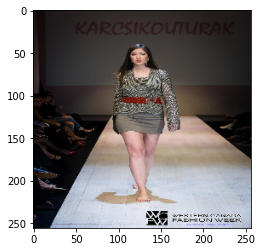

torch.Size([2, 256, 256])


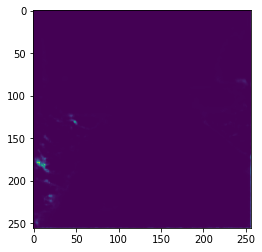

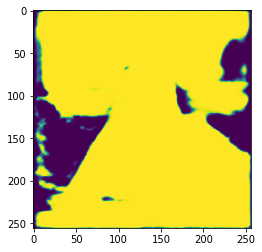

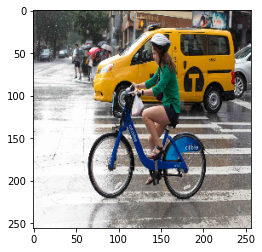

torch.Size([2, 256, 256])


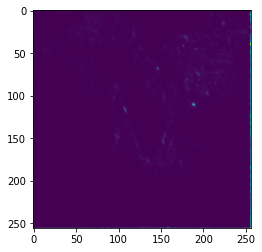

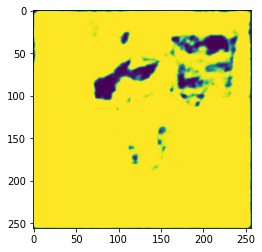

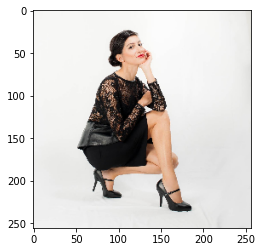

torch.Size([2, 256, 256])


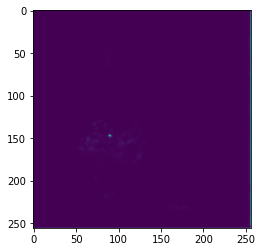

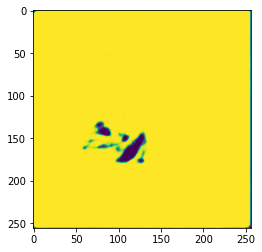

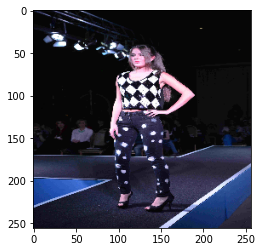

torch.Size([2, 256, 256])


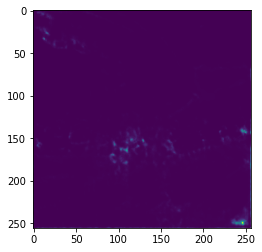

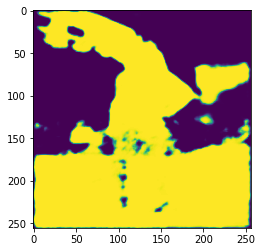

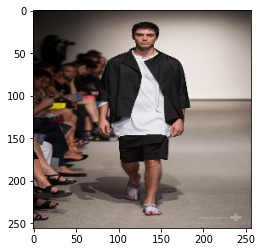

torch.Size([2, 256, 256])


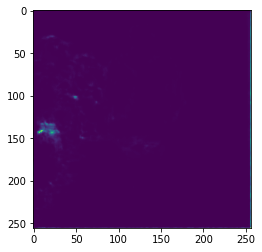

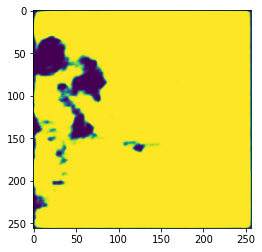

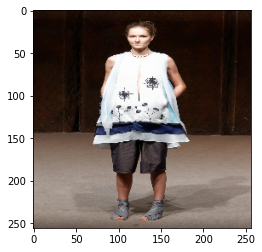

torch.Size([2, 256, 256])


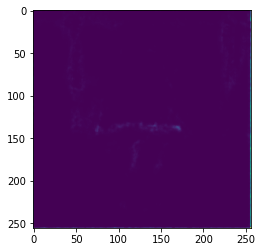

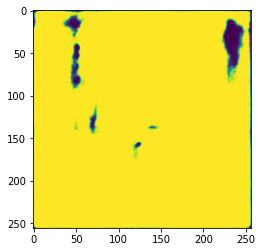

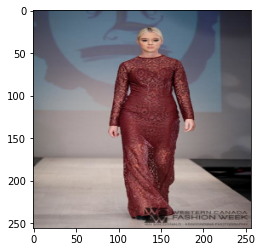

torch.Size([2, 256, 256])


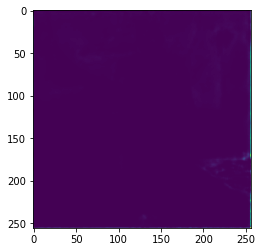

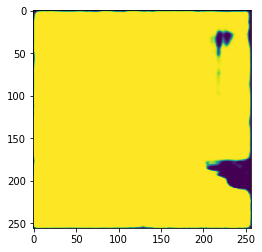

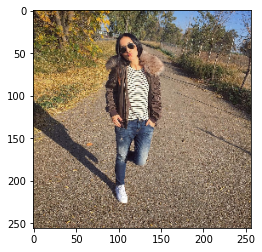

torch.Size([2, 256, 256])


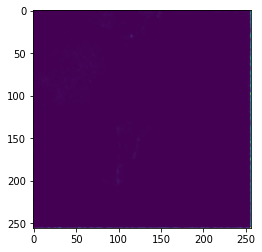

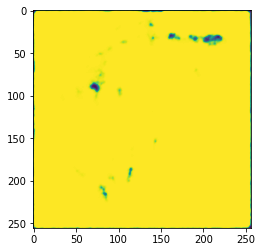

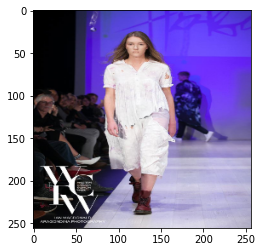

torch.Size([2, 256, 256])


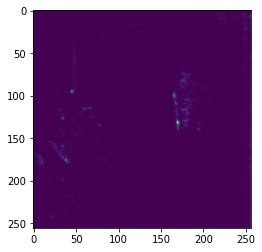

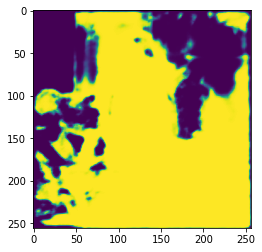

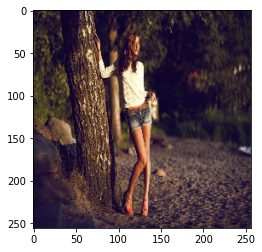

torch.Size([2, 256, 256])


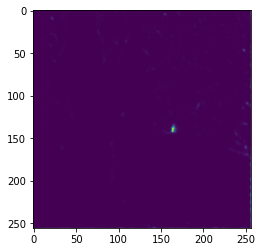

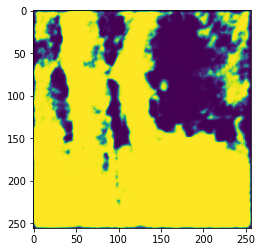

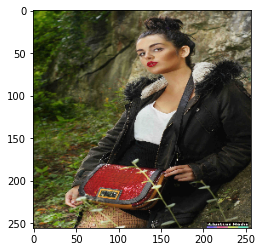

torch.Size([2, 256, 256])


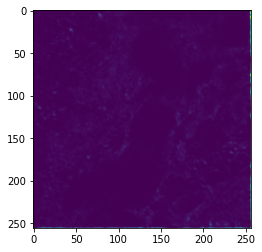

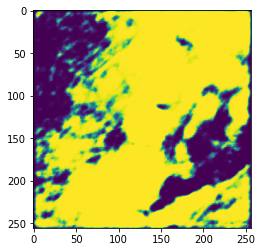

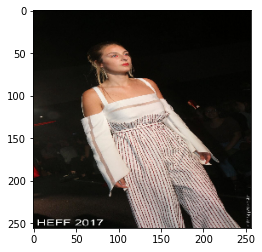

torch.Size([2, 256, 256])


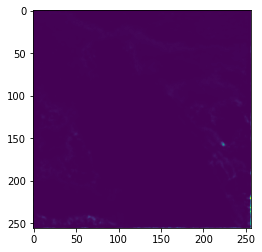

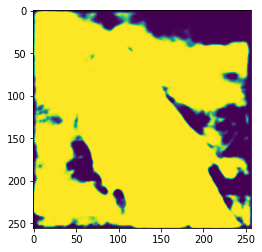

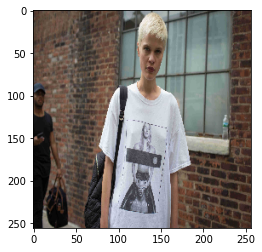

torch.Size([2, 256, 256])


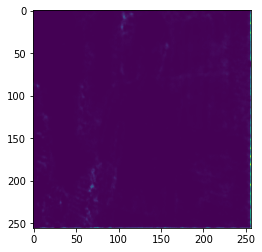

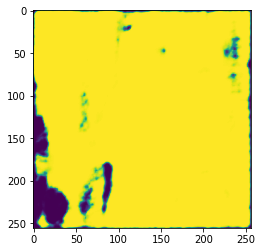

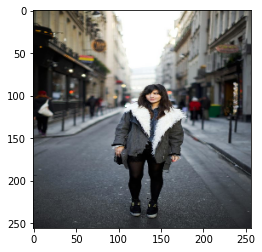

torch.Size([2, 256, 256])


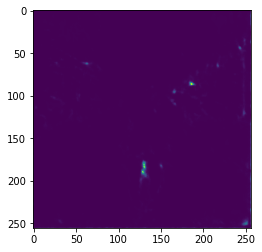

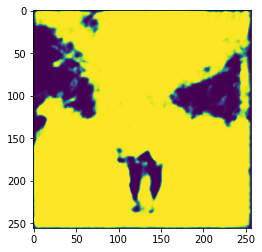

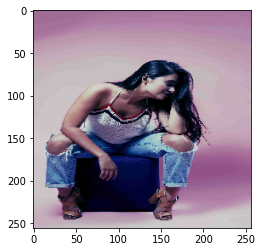

torch.Size([2, 256, 256])


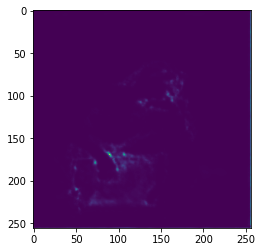

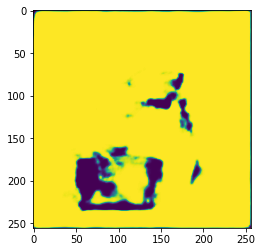

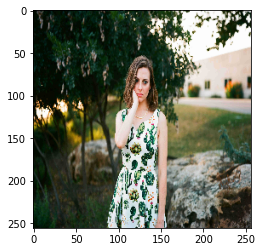

torch.Size([2, 256, 256])


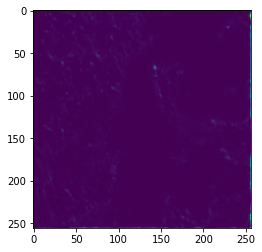

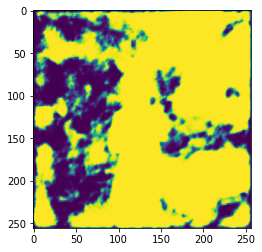

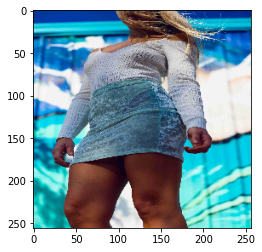

torch.Size([2, 256, 256])


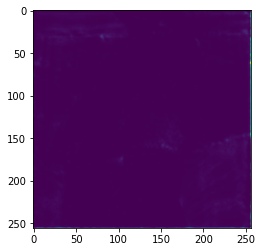

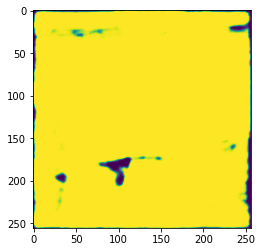

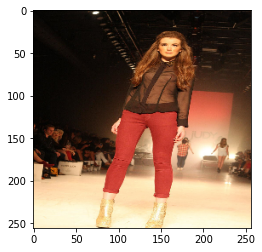

torch.Size([2, 256, 256])


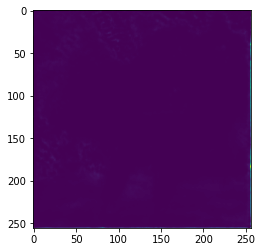

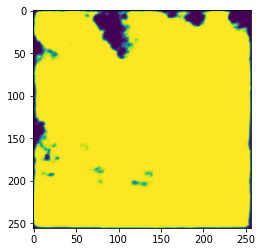

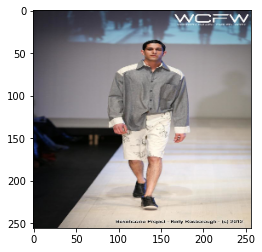

torch.Size([2, 256, 256])


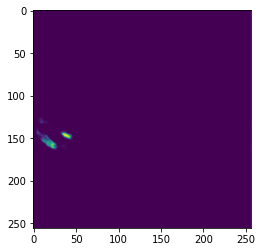

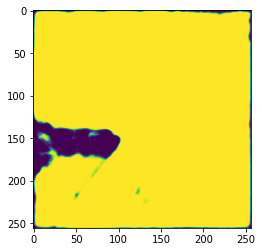

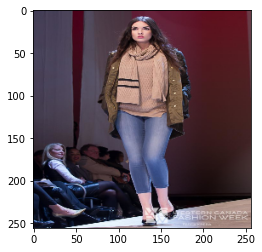

torch.Size([2, 256, 256])


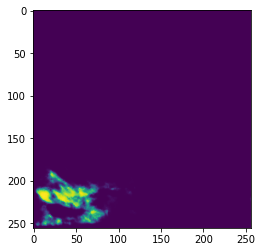

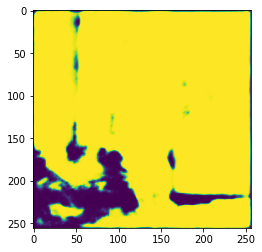

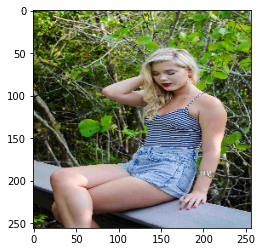

torch.Size([2, 256, 256])


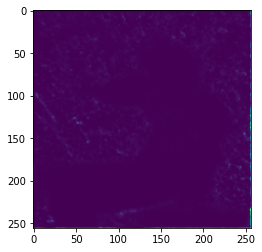

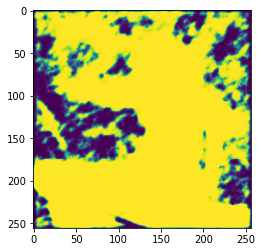

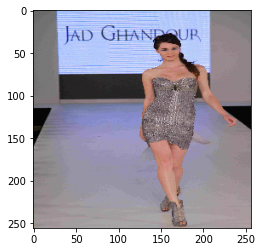

torch.Size([2, 256, 256])


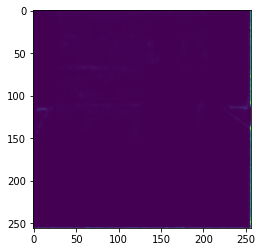

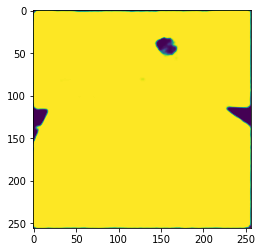

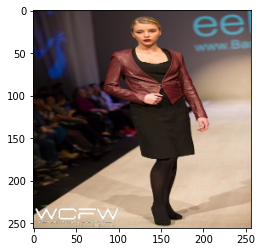

torch.Size([2, 256, 256])


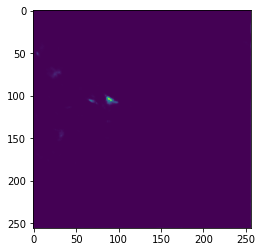

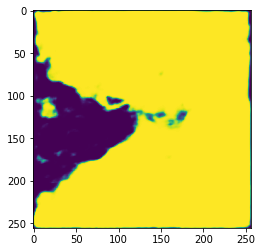

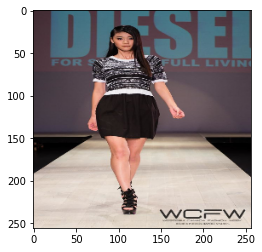

torch.Size([2, 256, 256])


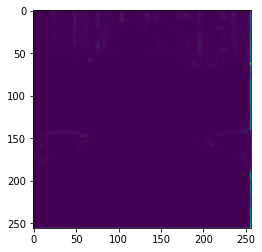

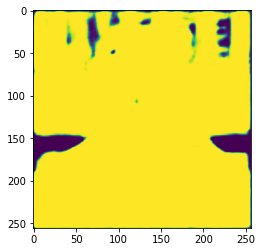

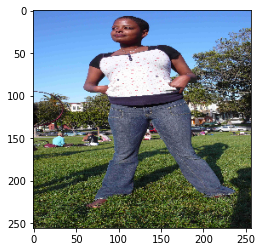

torch.Size([2, 256, 256])


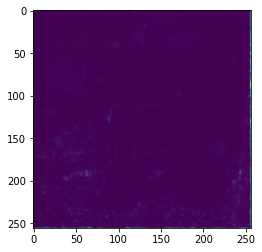

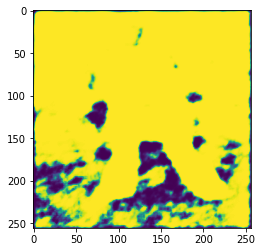

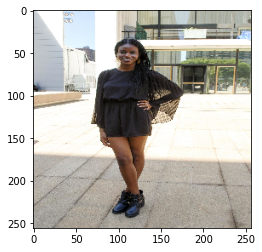

torch.Size([2, 256, 256])


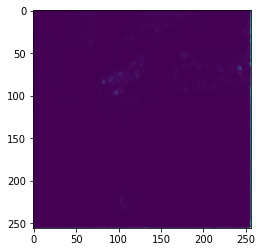

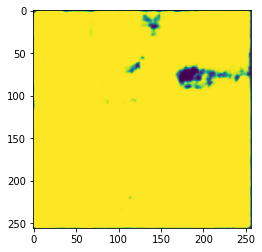

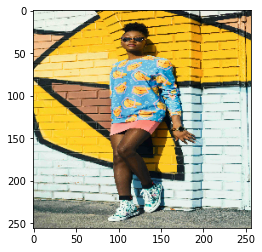

torch.Size([2, 256, 256])


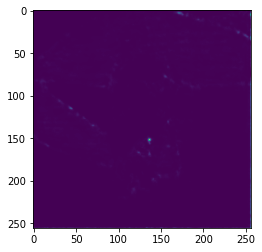

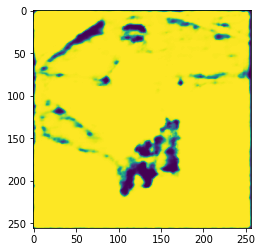

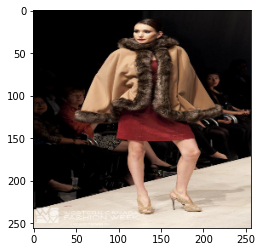

torch.Size([2, 256, 256])


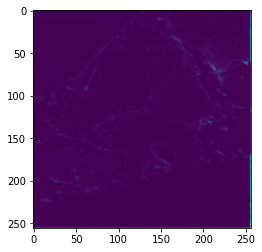

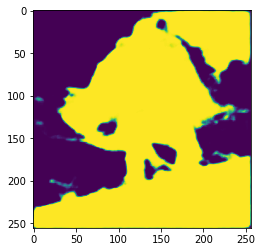

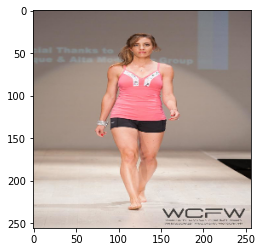

torch.Size([2, 256, 256])


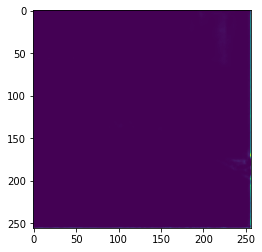

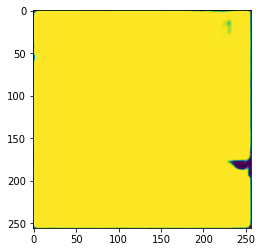

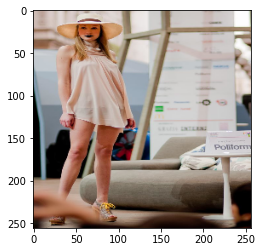

torch.Size([2, 256, 256])


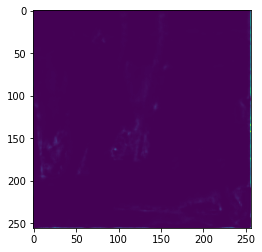

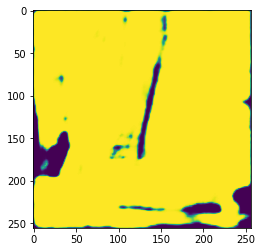

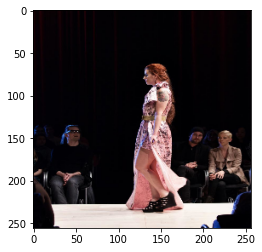

torch.Size([2, 256, 256])


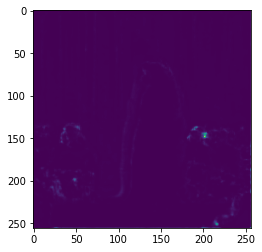

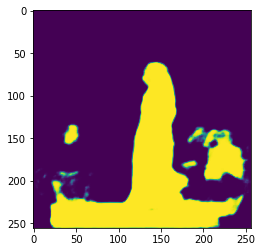

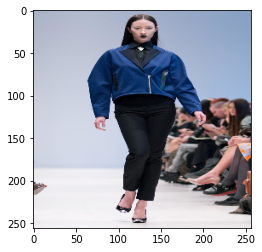

torch.Size([2, 256, 256])


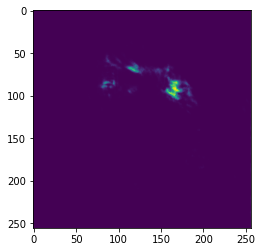

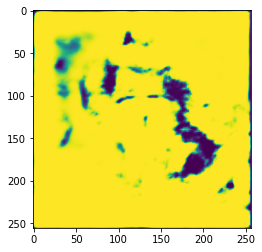

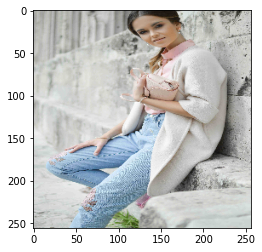

torch.Size([2, 256, 256])


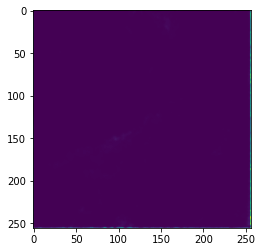

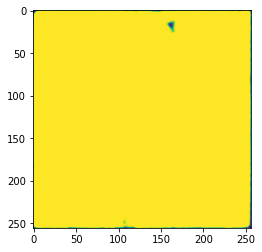

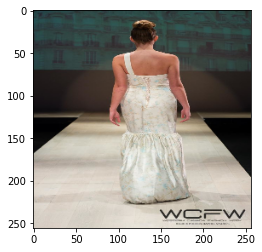

torch.Size([2, 256, 256])


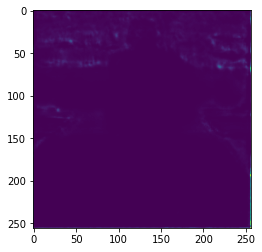

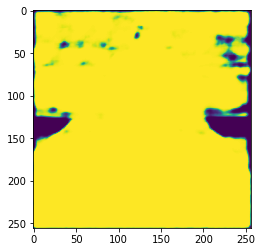

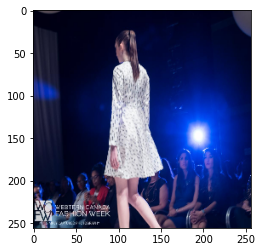

torch.Size([2, 256, 256])


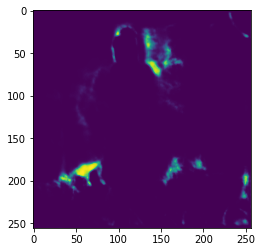

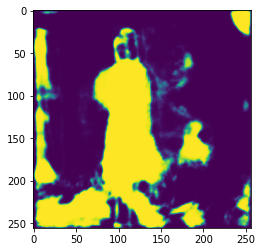

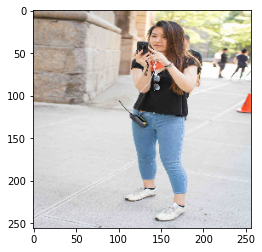

torch.Size([2, 256, 256])


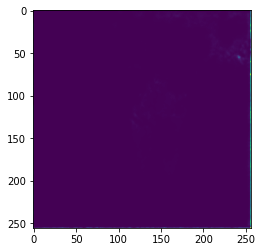

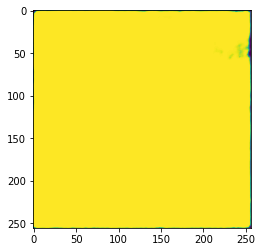

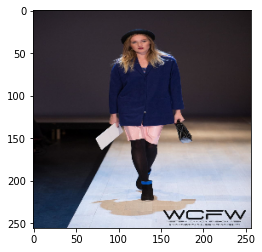

torch.Size([2, 256, 256])


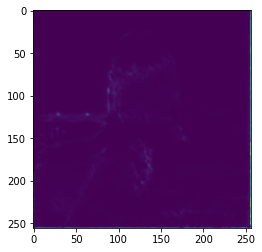

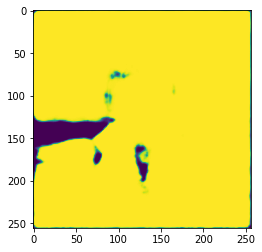

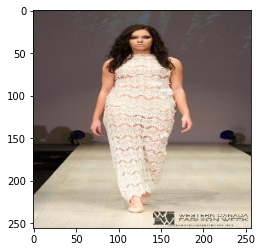

torch.Size([2, 256, 256])


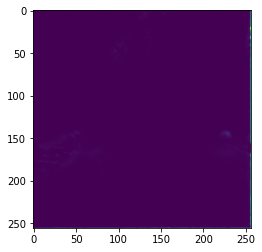

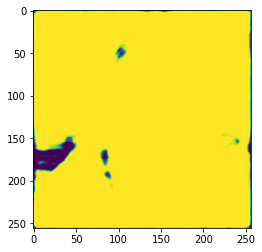

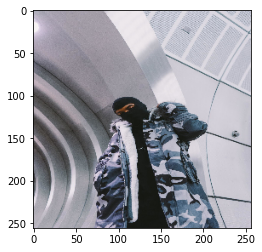

torch.Size([2, 256, 256])


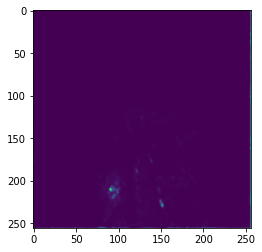

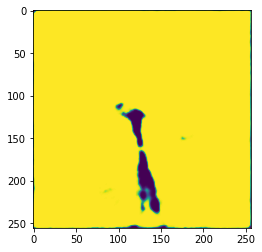

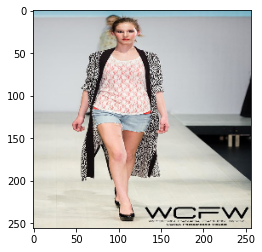

torch.Size([2, 256, 256])


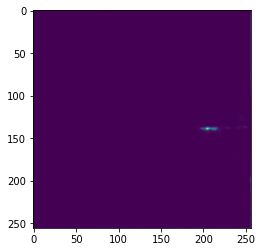

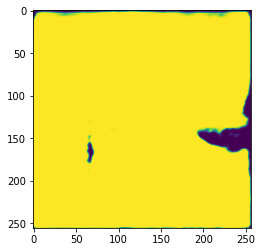

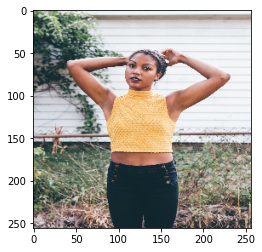

torch.Size([2, 256, 256])


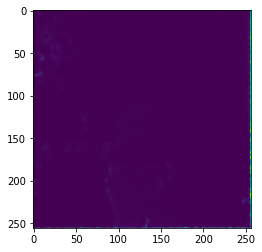

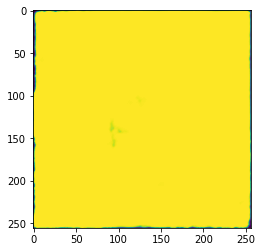

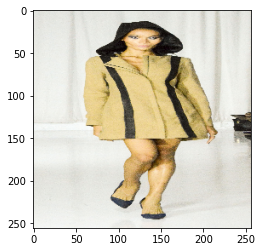

torch.Size([2, 256, 256])


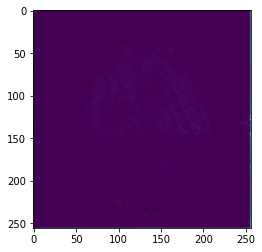

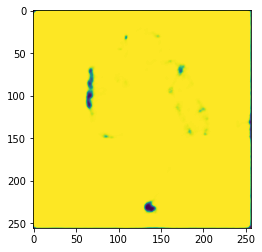

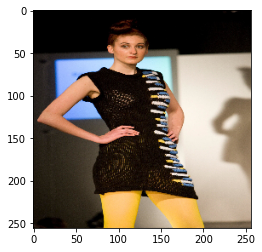

torch.Size([2, 256, 256])


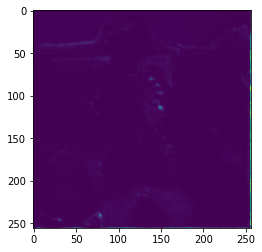

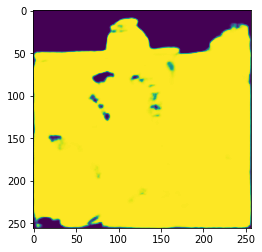

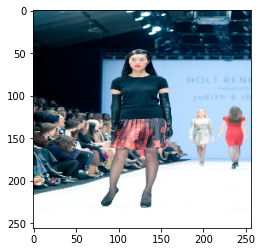

torch.Size([2, 256, 256])


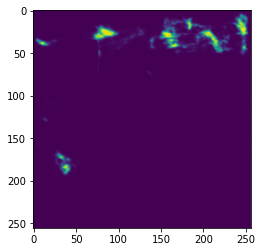

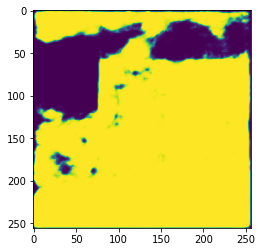

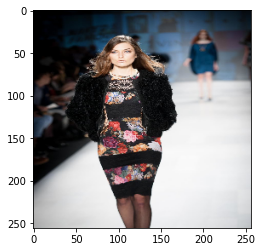

torch.Size([2, 256, 256])


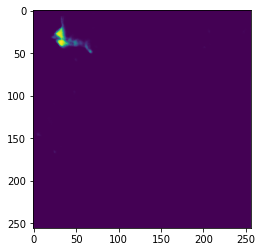

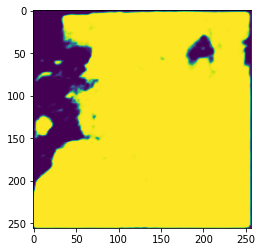

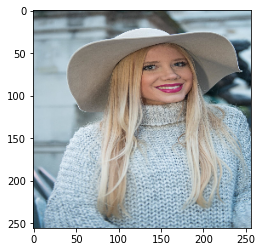

torch.Size([2, 256, 256])


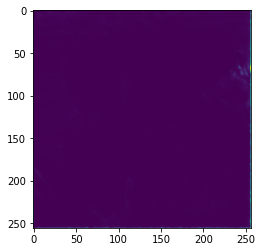

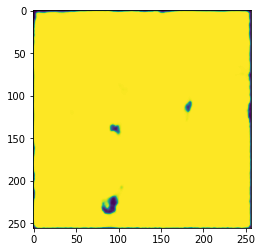

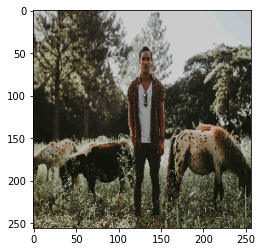

torch.Size([2, 256, 256])


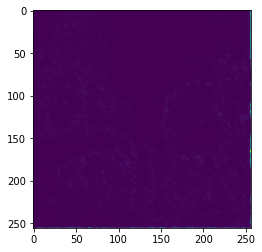

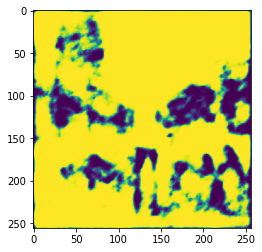

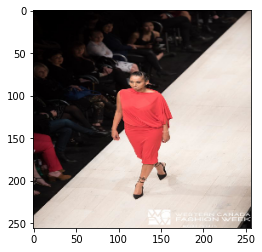

torch.Size([2, 256, 256])


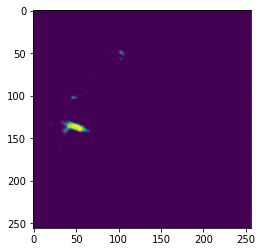

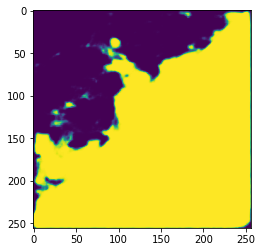

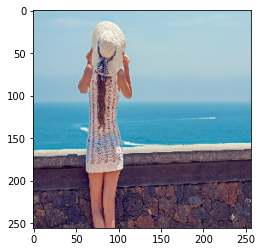

torch.Size([2, 256, 256])


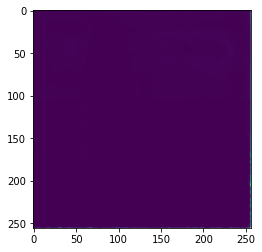

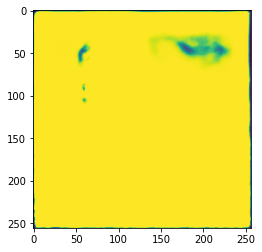

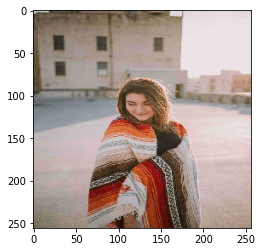

torch.Size([2, 256, 256])


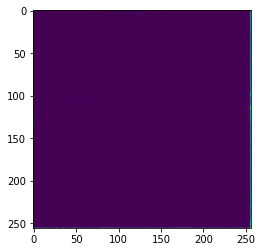

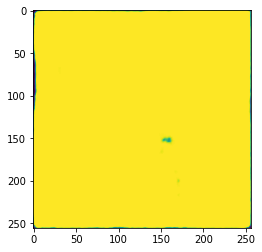

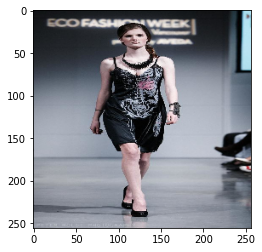

torch.Size([2, 256, 256])


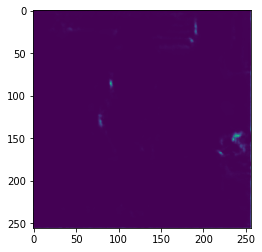

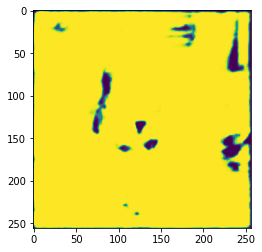

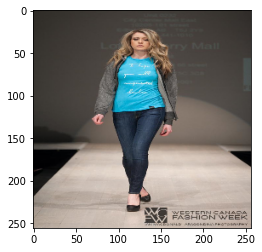

torch.Size([2, 256, 256])


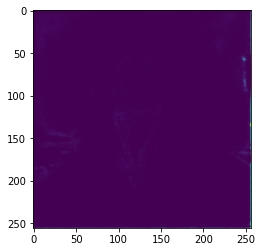

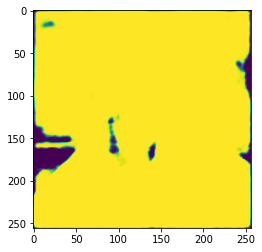

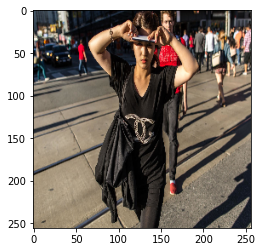

torch.Size([2, 256, 256])


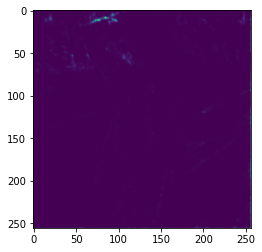

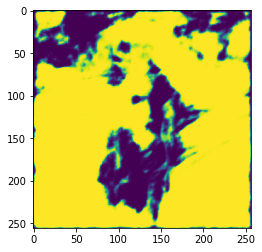

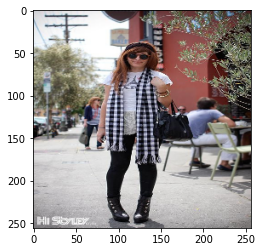

torch.Size([2, 256, 256])


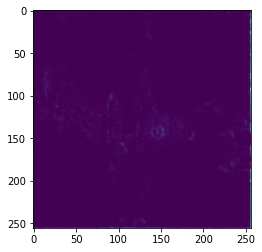

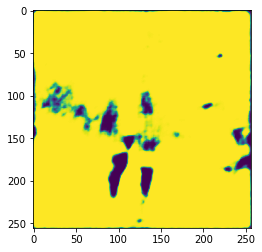

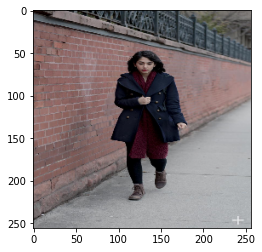

torch.Size([2, 256, 256])


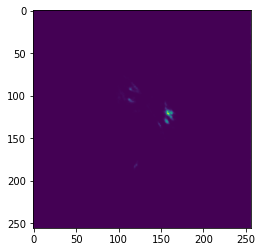

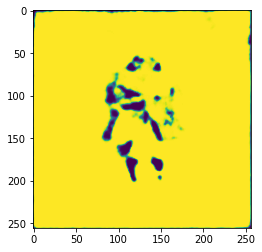

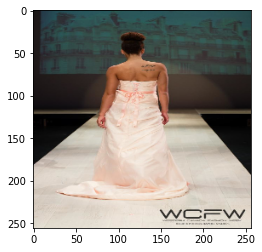

torch.Size([2, 256, 256])


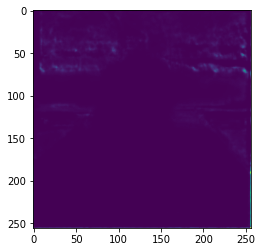

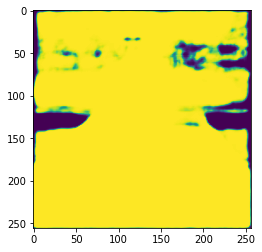

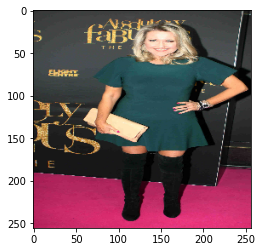

torch.Size([2, 256, 256])


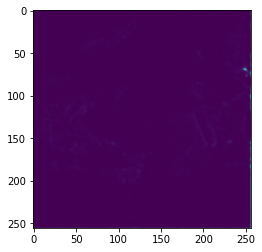

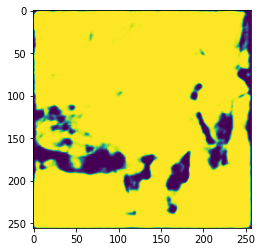

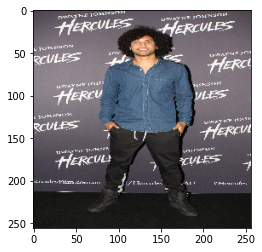

torch.Size([2, 256, 256])


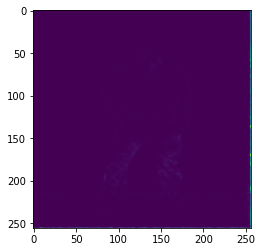

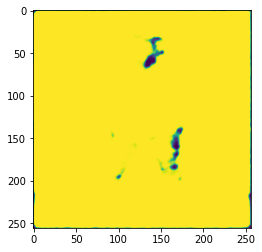

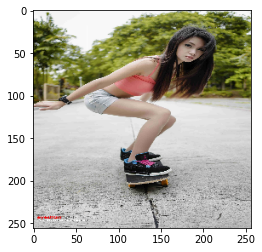

torch.Size([2, 256, 256])


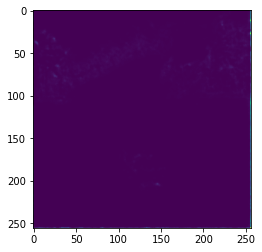

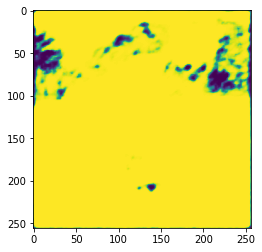

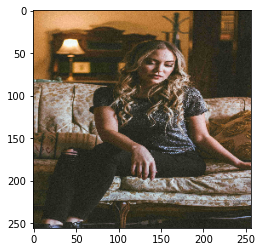

torch.Size([2, 256, 256])


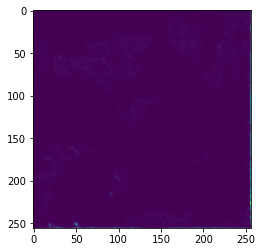

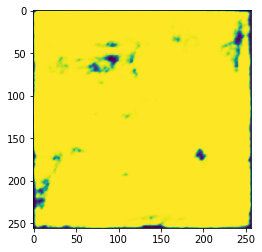

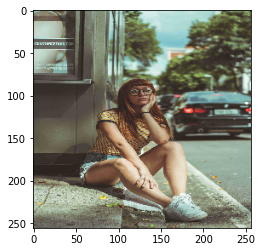

torch.Size([2, 256, 256])


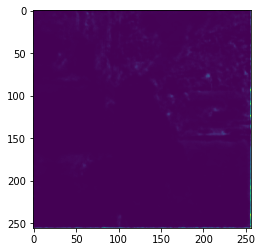

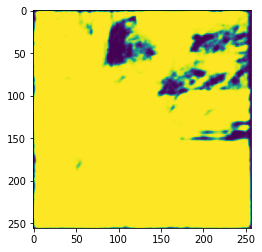

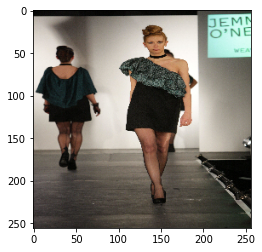

torch.Size([2, 256, 256])


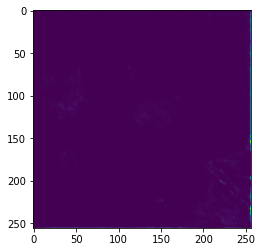

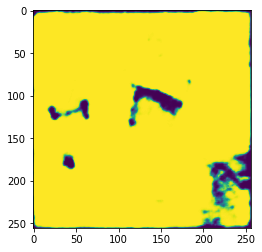

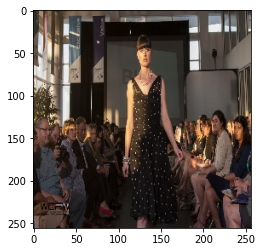

torch.Size([2, 256, 256])


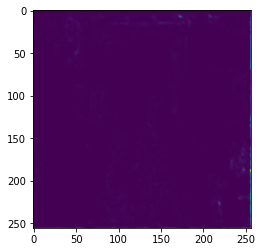

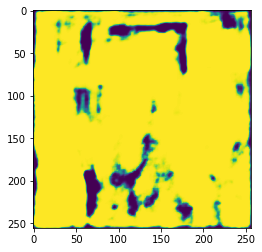

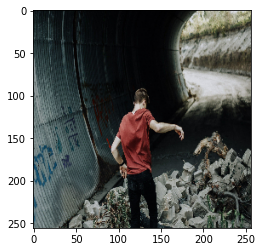

torch.Size([2, 256, 256])


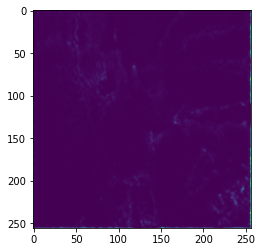

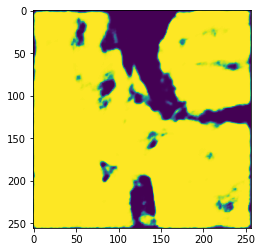

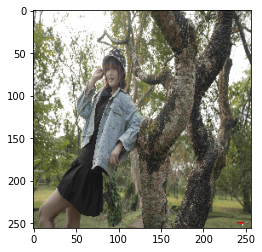

torch.Size([2, 256, 256])


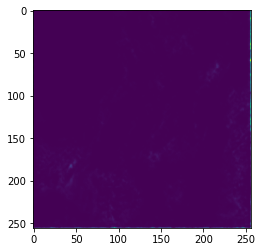

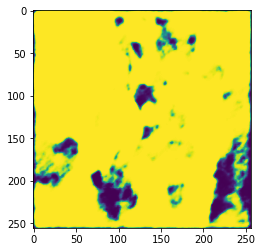

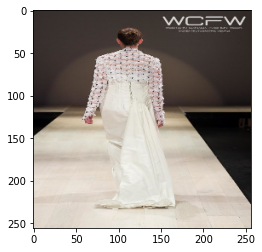

torch.Size([2, 256, 256])


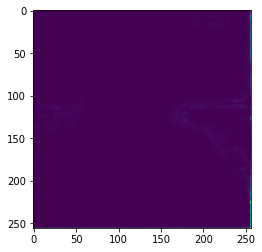

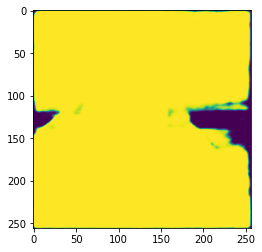

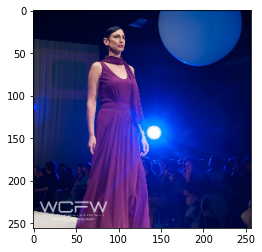

torch.Size([2, 256, 256])


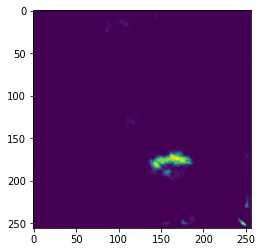

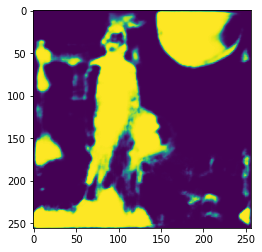

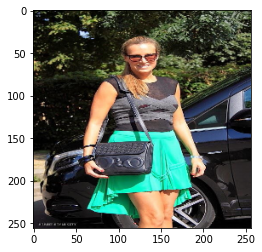

torch.Size([2, 256, 256])


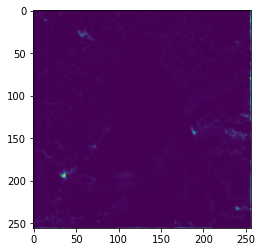

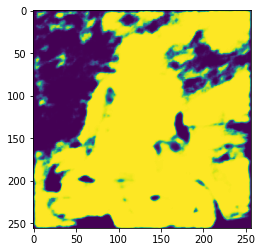

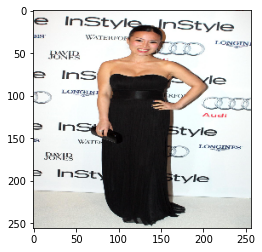

torch.Size([2, 256, 256])


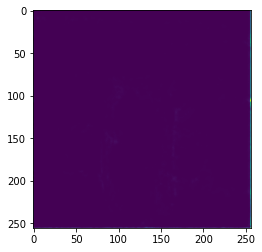

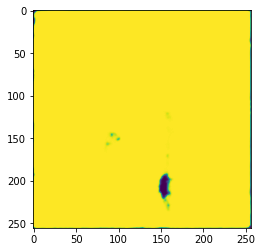

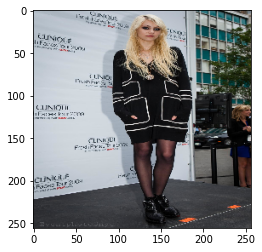

torch.Size([2, 256, 256])


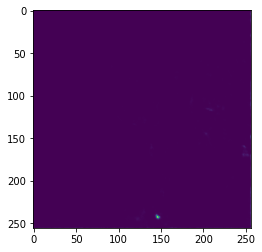

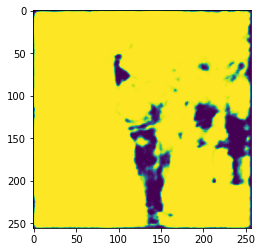

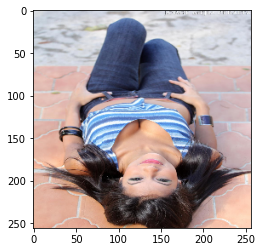

torch.Size([2, 256, 256])


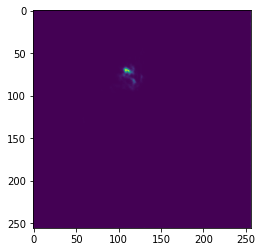

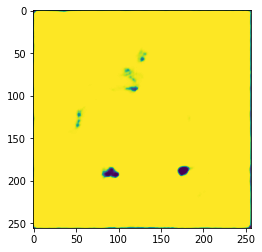

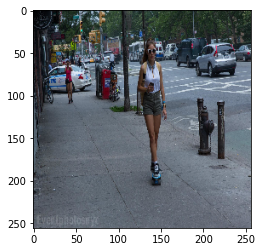

torch.Size([2, 256, 256])


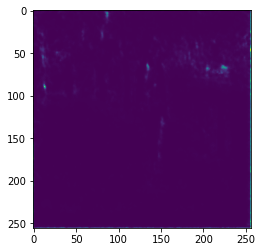

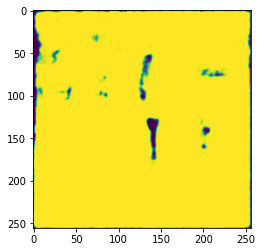

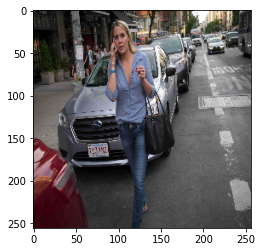

torch.Size([2, 256, 256])


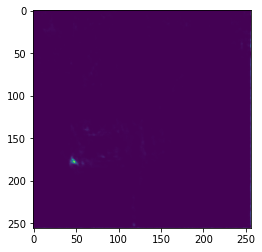

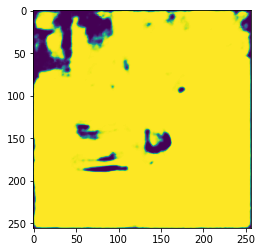

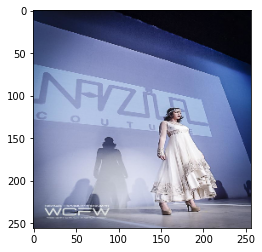

torch.Size([2, 256, 256])


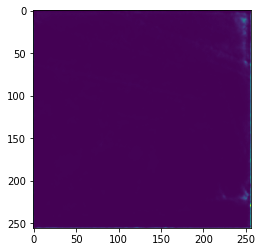

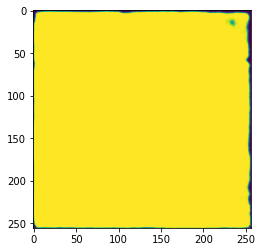

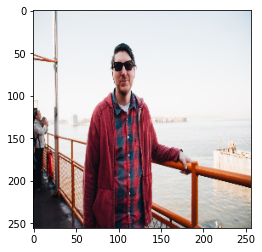

torch.Size([2, 256, 256])


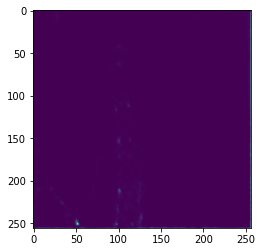

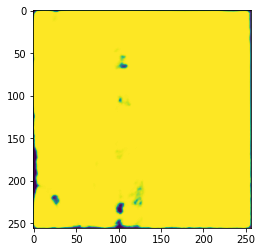

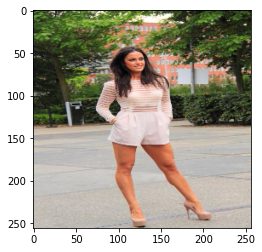

torch.Size([2, 256, 256])


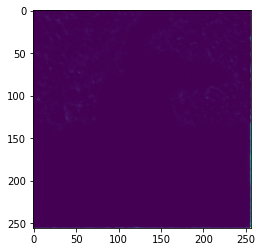

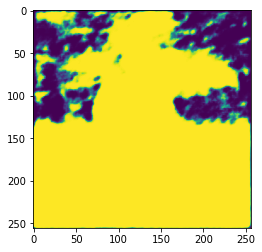

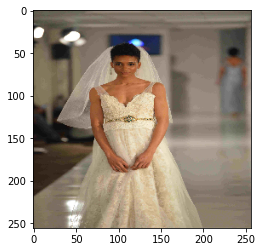

torch.Size([2, 256, 256])


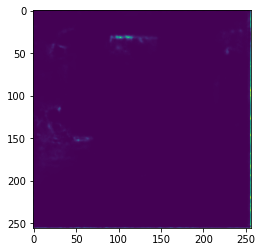

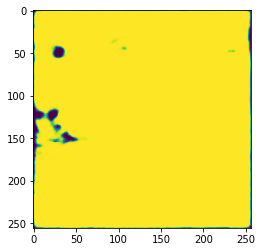

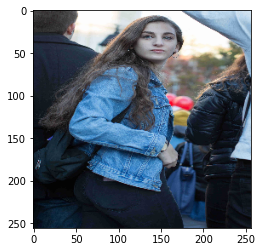

torch.Size([2, 256, 256])


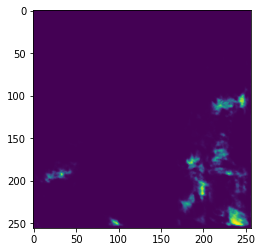

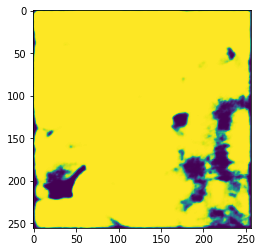

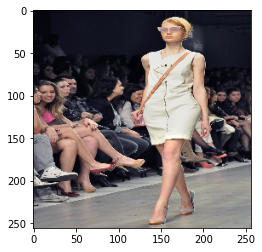

torch.Size([2, 256, 256])


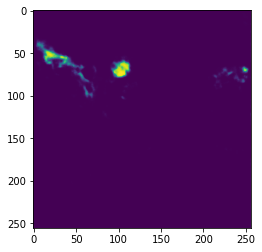

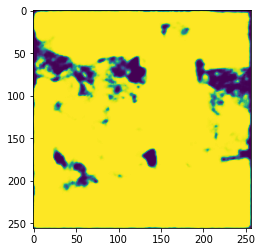

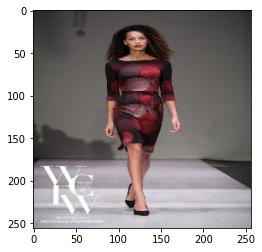

torch.Size([2, 256, 256])


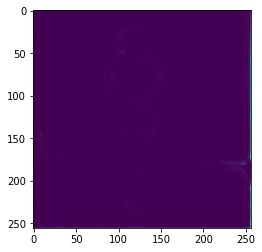

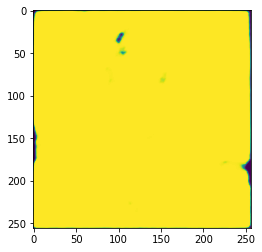

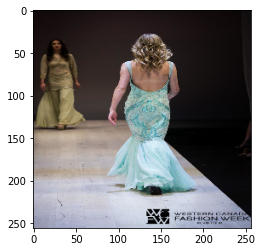

torch.Size([2, 256, 256])


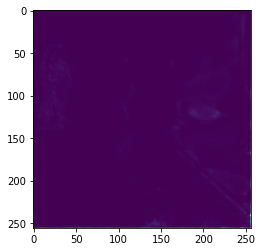

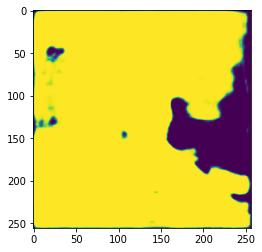

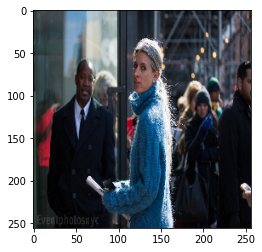

torch.Size([2, 256, 256])


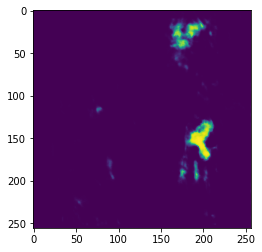

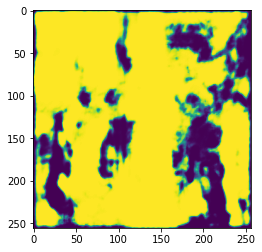

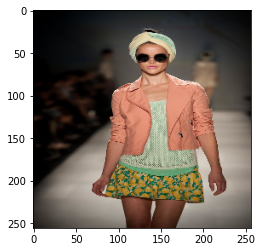

torch.Size([2, 256, 256])


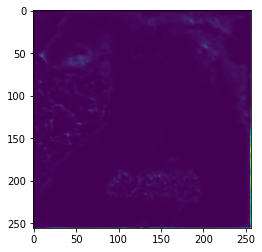

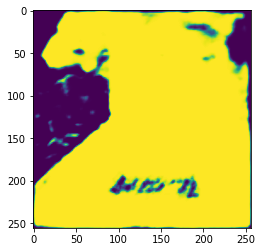

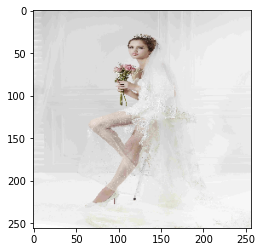

torch.Size([2, 256, 256])


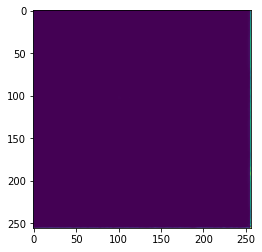

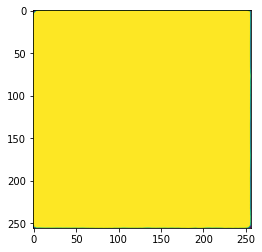

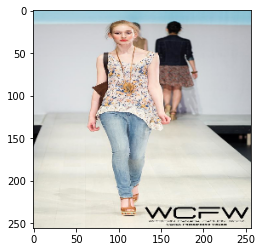

torch.Size([2, 256, 256])


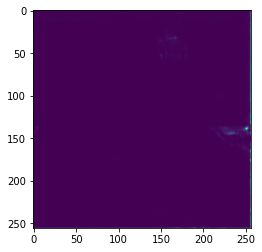

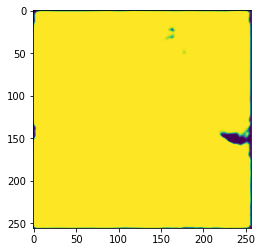

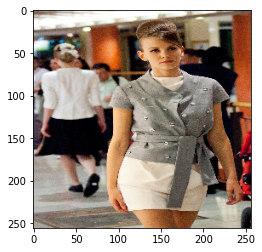

torch.Size([2, 256, 256])


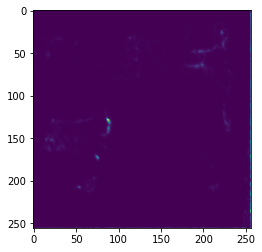

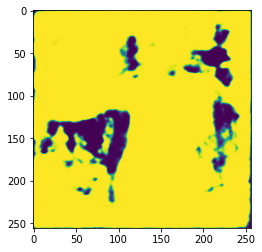

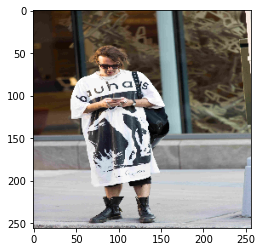

torch.Size([2, 256, 256])


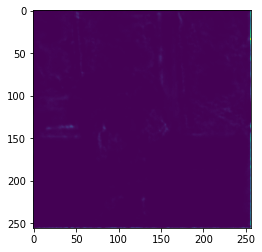

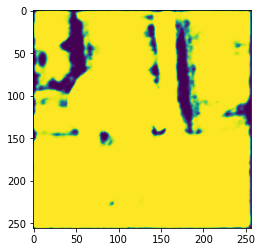

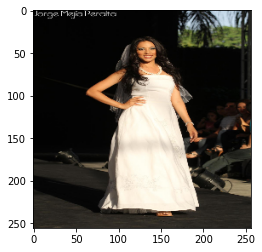

torch.Size([2, 256, 256])


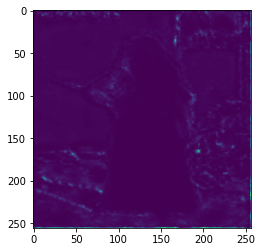

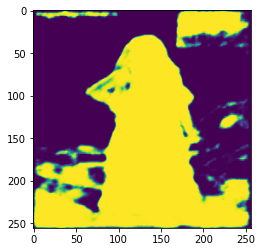

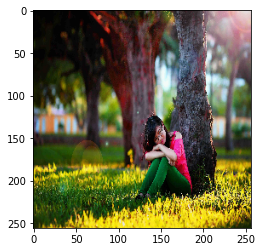

torch.Size([2, 256, 256])


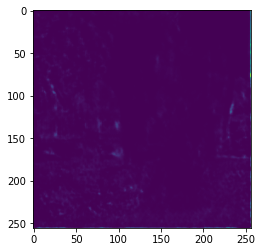

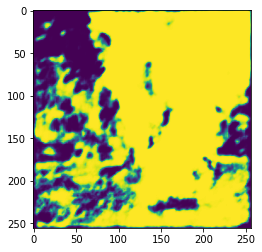

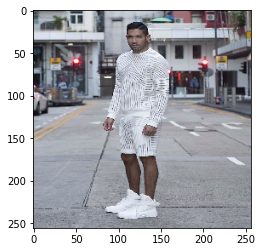

torch.Size([2, 256, 256])


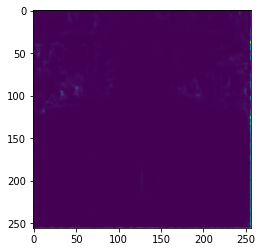

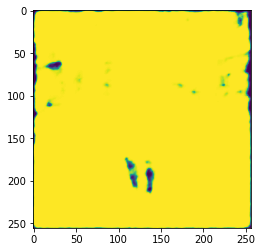

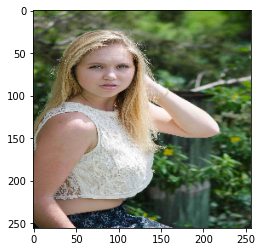

torch.Size([2, 256, 256])


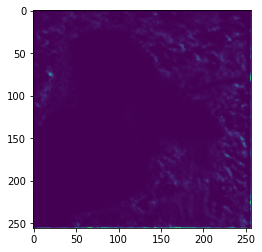

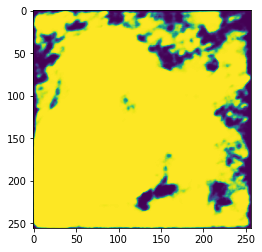

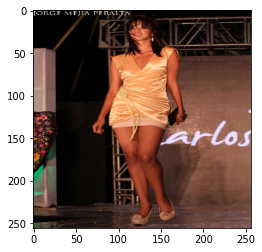

torch.Size([2, 256, 256])


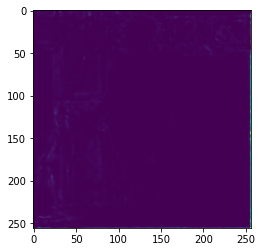

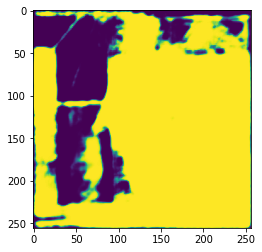

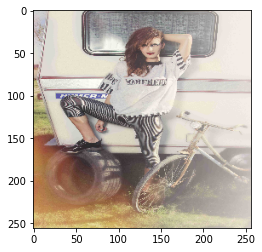

torch.Size([2, 256, 256])


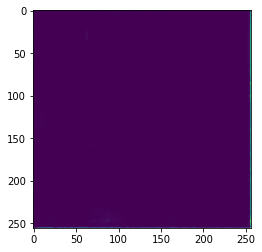

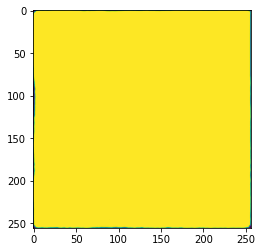

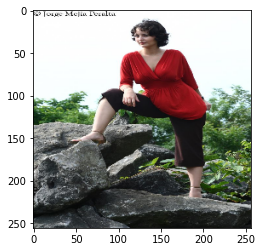

torch.Size([2, 256, 256])


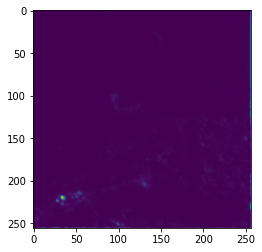

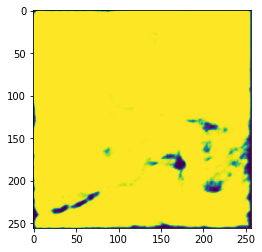

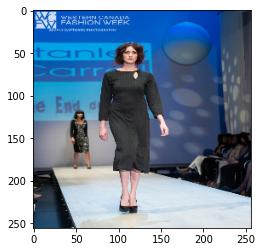

torch.Size([2, 256, 256])


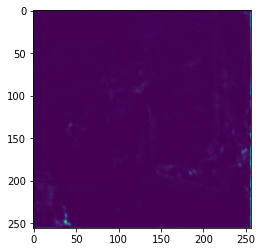

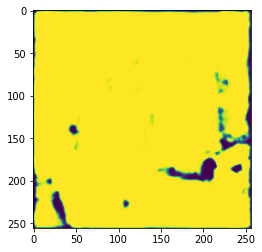

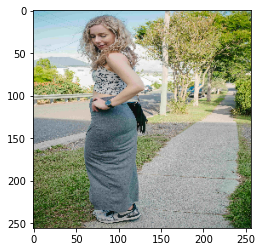

torch.Size([2, 256, 256])


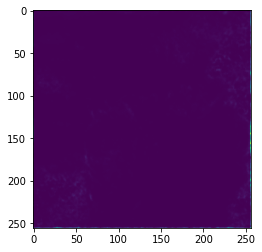

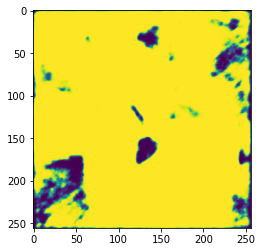

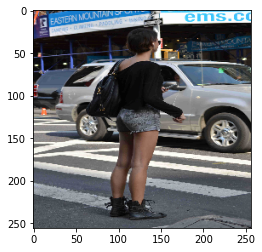

torch.Size([2, 256, 256])


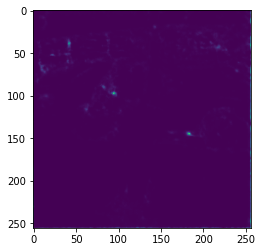

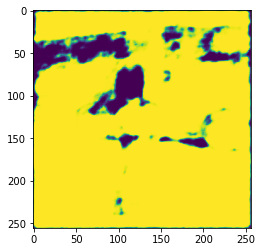

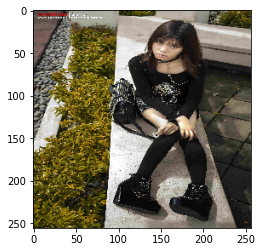

torch.Size([2, 256, 256])


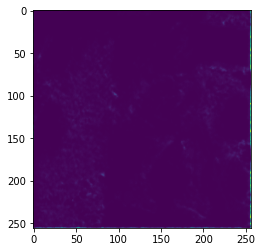

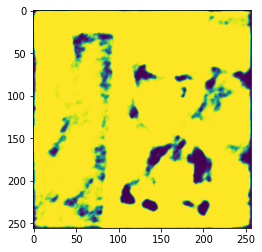

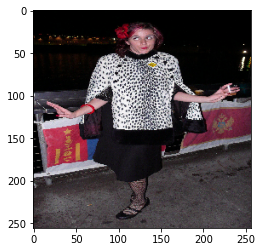

torch.Size([2, 256, 256])


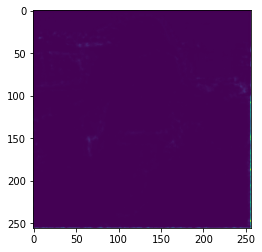

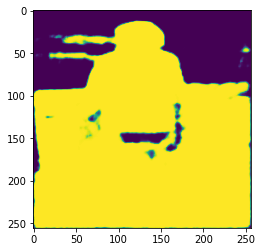

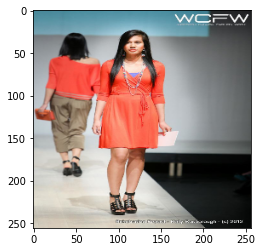

torch.Size([2, 256, 256])


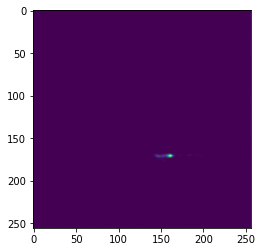

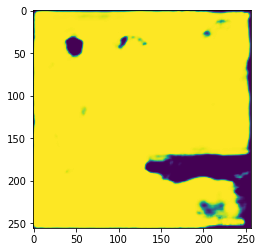

In [97]:
img_height, img_width = 256, 256
for image in test_list[:100]:
  image = ROOT_PATH_TEST + '/' +image
  img = cv2.imread(image)
  img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
  img = cv2.resize(img, (img_width, img_height))
  if img is None:
    continue
  plt.imshow(img)
  plt.show();
  # aug = A.Compose([
  #             A.augmentations.transforms.Resize(img_height, img_width, p=1),
  #         ])
  # aug = aug(image=img)
  # img = aug['image']
  img = img[np.newaxis, :, :, :] # add batch
  # (batch_size, channels, height, width)
  img = img.transpose(0, 3, 1, 2)
  pr_mask = model.predict(torch.tensor(img, dtype=torch.float32))
  pr_mask = pr_mask[0, :, :, :]
  # pr_mask2 = pr_mask[0, 1, :, :]
  # pr_mask3 = pr_mask[0, 2, :, :]
  print(pr_mask.shape)
  for dimm in range(pr_mask.shape[0]):
    plt.imshow(pr_mask[dimm])
    plt.show();

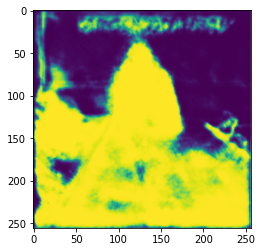

In [60]:
plt.imshow(pr_mask[1])